# **Weed Crop Detection using YOLO**
# **Vivek Sharma**
# **Reg. No.: 23MSD7013**

# **Objective:**
This project aims to develop a computer vision-based solution for weed detection using the YOLO11s model. By training a convolutional neural network on a dataset of annotated images, the model seeks to accurately distinguish between weed species and food crops. This approach contributes to precision agriculture by providing a foundation for automated weed management systems capable of targeted herbicide application or mechanical weed removal.

# **Downloading the dataset from Kaggle**

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d vinayakshanawad/weedcrop-image-dataset

Dataset URL: https://www.kaggle.com/datasets/vinayakshanawad/weedcrop-image-dataset
License(s): CC0-1.0
 98% 246M/251M [00:02<00:00, 93.6MB/s]
100% 251M/251M [00:02<00:00, 110MB/s] 


In [ ]:
import zipfile
zip_ref = zipfile.ZipFile('/content/weedcrop-image-dataset.zip', 'r')
zip_ref.extractall('/content')
zip_ref.close()

In [ ]:
#!pip install ultralytics

## Dataset Description: WeedCrop Image Dataset

The **WeedCrop Image Dataset** includes a total of **2822 images** labeled for weed and crop detection, with annotations in **YOLO v5 PyTorch format**.

### Pre-processing
Each image underwent the following pre-processing steps:
- **Auto-orientation** of pixel data, which involved stripping EXIF orientation metadata to ensure consistent image orientation.

### Augmentation
To enhance model robustness and generalizability, the following augmentations were applied to generate three variations of each original image:
- **Random Rotation**: Images were rotated with equal probability in one of four directions — no rotation, clockwise 90°, counter-clockwise 90°.
- **Shearing**: Random horizontal and vertical shearing of between -15° and +15°.
- **Brightness Adjustment**: Random adjustment of brightness within a range of ±25%.

### Classes
The dataset includes two classes:
- **Crop**
- **Weed**

### Dataset Structure
- **Train directory** contains **2469 images** and respective labels in yolov5 Pytorch format.
- **Validation directory** contains **235 images** and respective labels in yolov5 Pytorch format.
- **Test directory** contains **118 images** and respective labels in yolov5 Pytorch format.


### *Displaying Sample Images*

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import cv2

In [ ]:
# Define paths for train, validation, and test image folders
train_image_folder = '/content/WeedCrop.v1i.yolov5pytorch/train/images'
val_image_folder = '/content/WeedCrop.v1i.yolov5pytorch/valid/images'
test_image_folder = '/content/WeedCrop.v1i.yolov5pytorch/test/images'

In [ ]:
# Function to display sample images from a given folder
def display_sample_images(folder_path, num_images=6, title="Sample Images"):
    image_files = [f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.jpeg', '.png'))][:num_images]
    plt.figure(figsize=(12, 8))
    plt.suptitle(title, fontsize=16)

    for i, image_file in enumerate(image_files):
        image_path = os.path.join(folder_path, image_file)
        image = cv2.imread(image_path)

        # Only proceed if image is successfully loaded
        if image is not None:
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

            plt.subplot(2, 3, i + 1)  # Arrange images in a 2x3 grid
            plt.imshow(image)
            plt.axis('off')
            plt.title(f"Image {i + 1}")

    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to make room for title
    plt.show()

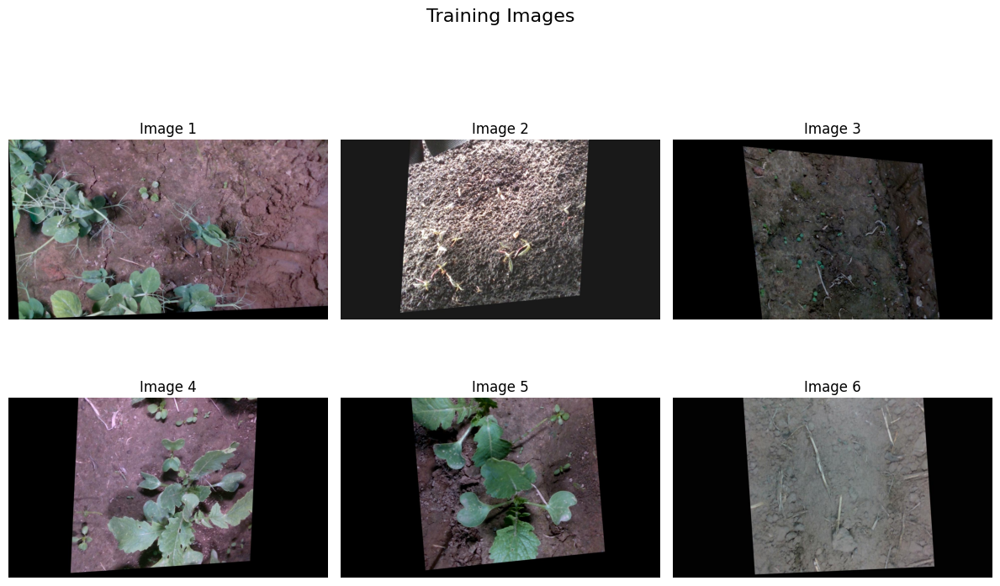

In [ ]:
# Display sample images from Train, Validation, and Test directories
display_sample_images(train_image_folder, num_images=6, title="Training Images")

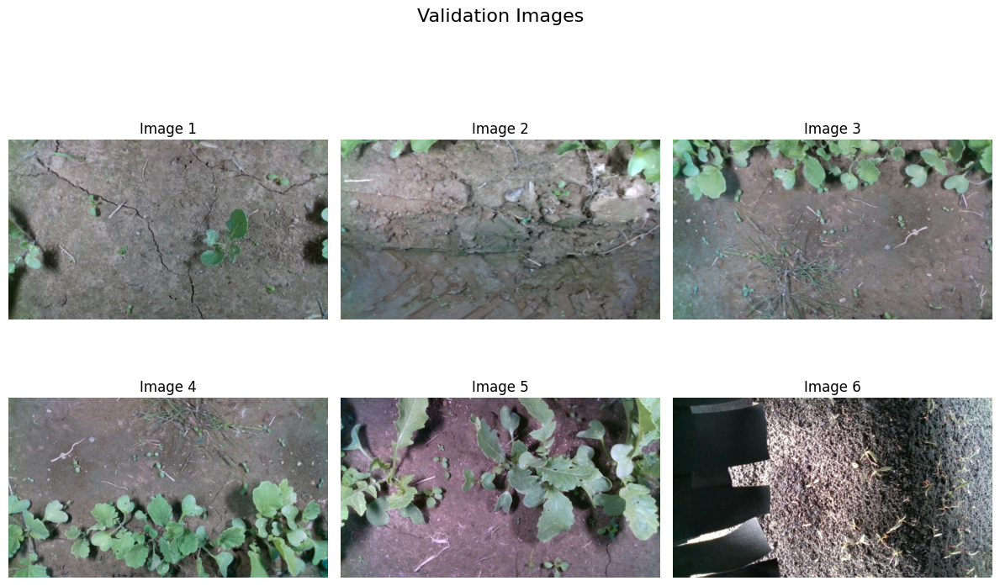

In [ ]:
display_sample_images(val_image_folder, num_images=6, title="Validation Images")

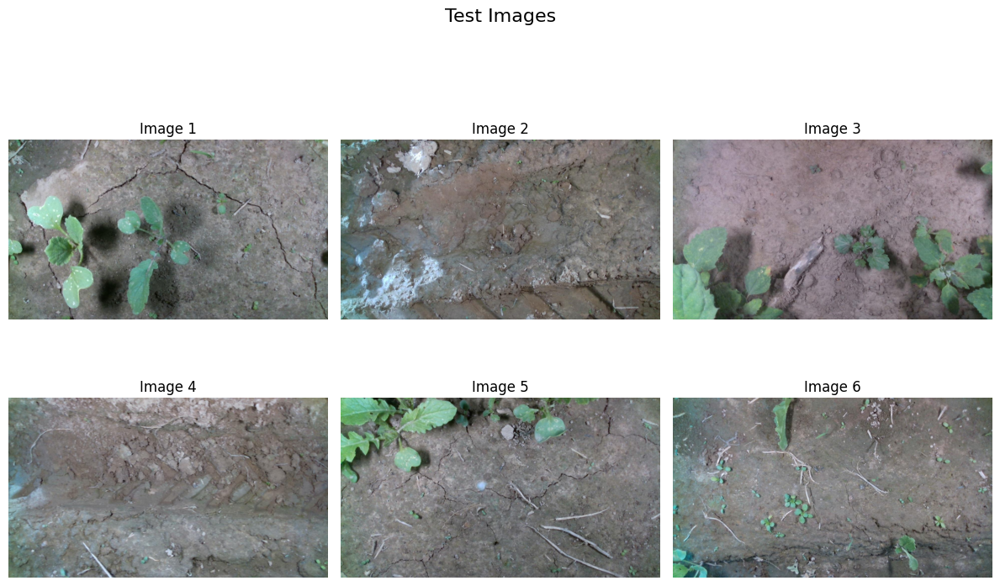

In [ ]:
display_sample_images(test_image_folder, num_images=6, title="Test Images")

## Model Buildinng and Training using YOLO 11s

In [ ]:
import ultralytics

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
from ultralytics import YOLO

In [ ]:
model = YOLO('yolo11s.pt')

100%|██████████| 18.4M/18.4M [00:00<00:00, 122MB/s] 


In [ ]:
model.train(
    data = "/content/WeedCrop.v1i.yolov5pytorch/data.yaml",
    imgsz = 640,
    epochs = 60,
    batch = 16
)

Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11s.pt, data=/content/WeedCrop.v1i.yolov5pytorch/data.yaml, epochs=60, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train22, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_

train: Scanning /content/WeedCrop.v1i.yolov5pytorch/train/labels.cache... 2469 images, 101 backgrounds, 0 corrupt: 100%|██████████| 2469/2469 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/WeedCrop.v1i.yolov5pytorch/valid/labels.cache... 235 images, 0 backgrounds, 0 corrupt: 100%|██████████| 235/235 [00:00<?, ?it/s]


Plotting labels to runs/detect/train22/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train22
Starting training for 60 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/60      8.37G      1.903      1.265      1.033         63        640: 100%|██████████| 155/155 [01:23<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.63it/s]

                   all        235       1605       0.52      0.666      0.622      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/60      8.21G      1.952      1.331      1.042         61        640: 100%|██████████| 155/155 [01:06<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.83it/s]

                   all        235       1605      0.668      0.617      0.636      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/60      8.17G      2.008      1.385      1.063         11        640: 100%|██████████| 155/155 [01:03<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.56it/s]

                   all        235       1605      0.508      0.685      0.642      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/60       8.2G      2.029      1.402      1.062         86        640: 100%|██████████| 155/155 [01:07<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.41it/s]

                   all        235       1605      0.574      0.559      0.601      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/60      8.22G      2.021      1.402       1.07         42        640: 100%|██████████| 155/155 [01:05<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.66it/s]

                   all        235       1605      0.629      0.577      0.581      0.271



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/60      8.21G      2.015      1.385      1.057         51        640: 100%|██████████| 155/155 [01:07<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.55it/s]

                   all        235       1605      0.594      0.635      0.595      0.249



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/60      8.23G      1.999      1.362      1.054         85        640: 100%|██████████| 155/155 [01:03<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.94it/s]

                   all        235       1605      0.481      0.604      0.506      0.247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/60       8.2G      1.977      1.355      1.048         29        640: 100%|██████████| 155/155 [01:08<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.94it/s]

                   all        235       1605      0.661      0.739      0.722      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/60       8.2G      1.984      1.357       1.05         23        640: 100%|██████████| 155/155 [01:04<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  2.82it/s]

                   all        235       1605      0.562      0.685      0.617       0.31



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/60      8.24G       1.97      1.317       1.05         22        640: 100%|██████████| 155/155 [01:03<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.76it/s]

                   all        235       1605      0.676      0.691      0.675      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/60      8.18G      1.948      1.302      1.042         22        640: 100%|██████████| 155/155 [01:06<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.81it/s]

                   all        235       1605       0.74       0.62      0.684      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/60      8.23G       1.92      1.281      1.029         44        640: 100%|██████████| 155/155 [01:04<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.47it/s]

                   all        235       1605      0.639      0.608      0.665      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/60      8.19G      1.896      1.267      1.022         50        640: 100%|██████████| 155/155 [01:08<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.19it/s]


                   all        235       1605      0.711      0.592      0.676      0.333

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/60       8.2G      1.898      1.264       1.03         37        640: 100%|██████████| 155/155 [01:04<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.74it/s]

                   all        235       1605      0.638      0.669      0.664      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/60       8.2G      1.903      1.256      1.028         25        640: 100%|██████████| 155/155 [01:08<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.06it/s]

                   all        235       1605       0.62      0.674      0.694      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/60       8.2G      1.881      1.228      1.022         38        640: 100%|██████████| 155/155 [01:09<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.88it/s]


                   all        235       1605      0.657      0.732      0.693      0.381

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/60      8.19G      1.868      1.225      1.016         54        640: 100%|██████████| 155/155 [01:07<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.85it/s]

                   all        235       1605      0.637      0.608       0.65      0.303



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/60      8.23G      1.841      1.195      1.016         54        640: 100%|██████████| 155/155 [01:05<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.92it/s]

                   all        235       1605      0.632      0.764      0.717      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/60      8.22G      1.828      1.206      1.014         56        640: 100%|██████████| 155/155 [01:04<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.62it/s]

                   all        235       1605      0.699       0.63      0.659      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/60      8.24G      1.825      1.211      1.006         71        640: 100%|██████████| 155/155 [01:11<00:00,  2.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.69it/s]

                   all        235       1605      0.593      0.615      0.585      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/60      8.19G      1.829      1.196      1.012         29        640: 100%|██████████| 155/155 [01:04<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.45it/s]

                   all        235       1605      0.663      0.625      0.642      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/60      8.24G      1.811      1.184      1.011         28        640: 100%|██████████| 155/155 [01:09<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.17it/s]

                   all        235       1605      0.577      0.676      0.659      0.342



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/60      8.23G      1.813      1.187      1.002         28        640: 100%|██████████| 155/155 [01:07<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.44it/s]

                   all        235       1605      0.625      0.719      0.656      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/60      8.23G      1.787      1.175     0.9995         31        640: 100%|██████████| 155/155 [01:07<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.76it/s]

                   all        235       1605      0.724      0.753      0.764      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/60      8.21G      1.788      1.146      1.003         37        640: 100%|██████████| 155/155 [01:04<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.81it/s]

                   all        235       1605      0.736      0.573      0.634      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/60      8.22G      1.803      1.147     0.9966         31        640: 100%|██████████| 155/155 [01:05<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.51it/s]

                   all        235       1605        0.7      0.697      0.748      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/60      8.23G      1.768      1.135     0.9945         43        640: 100%|██████████| 155/155 [01:09<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.38it/s]

                   all        235       1605      0.638      0.766      0.762      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/60       8.2G      1.762      1.135     0.9869         47        640: 100%|██████████| 155/155 [01:07<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.50it/s]

                   all        235       1605      0.757      0.665      0.722      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/60      8.23G       1.74      1.115     0.9833         50        640: 100%|██████████| 155/155 [01:10<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.92it/s]

                   all        235       1605      0.635      0.688      0.665       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/60      8.23G      1.738      1.111     0.9852         38        640: 100%|██████████| 155/155 [01:08<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.31it/s]

                   all        235       1605      0.616      0.773      0.713      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/60      8.21G      1.724        1.1     0.9828         60        640: 100%|██████████| 155/155 [01:09<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.38it/s]

                   all        235       1605      0.731      0.674      0.737      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/60      8.24G      1.731      1.102     0.9877         64        640: 100%|██████████| 155/155 [01:09<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.03it/s]

                   all        235       1605      0.712      0.647      0.682      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/60      8.21G      1.699      1.078     0.9771         38        640: 100%|██████████| 155/155 [01:11<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.59it/s]


                   all        235       1605      0.721      0.701      0.705      0.364

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/60      8.23G      1.684      1.068     0.9778         60        640: 100%|██████████| 155/155 [01:06<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.05it/s]

                   all        235       1605      0.687      0.674      0.677       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/60      8.22G      1.692      1.069     0.9733         42        640: 100%|██████████| 155/155 [01:05<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.96it/s]

                   all        235       1605      0.683      0.671      0.699       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/60       8.2G       1.68      1.068     0.9757         47        640: 100%|██████████| 155/155 [01:06<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.44it/s]


                   all        235       1605      0.718       0.66      0.706      0.382

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/60      8.19G       1.68      1.061     0.9724         29        640: 100%|██████████| 155/155 [01:07<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  2.92it/s]


                   all        235       1605      0.694      0.668      0.694      0.366

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/60      8.24G      1.665      1.061       0.97         52        640: 100%|██████████| 155/155 [01:10<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.73it/s]


                   all        235       1605      0.702      0.753      0.736      0.404

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/60      8.24G      1.649      1.042     0.9704         45        640: 100%|██████████| 155/155 [01:07<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.92it/s]

                   all        235       1605      0.732      0.684      0.715        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/60      8.23G      1.651      1.046     0.9642         30        640: 100%|██████████| 155/155 [01:09<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.73it/s]

                   all        235       1605       0.75      0.696       0.73      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/60      8.23G       1.64      1.034     0.9669         23        640: 100%|██████████| 155/155 [01:05<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.28it/s]

                   all        235       1605      0.623      0.729      0.693      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/60      8.21G      1.629      1.038     0.9632         76        640: 100%|██████████| 155/155 [01:11<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.54it/s]

                   all        235       1605      0.666      0.711      0.717      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/60      8.18G      1.624      1.029      0.963         45        640: 100%|██████████| 155/155 [01:05<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.66it/s]

                   all        235       1605      0.667      0.666      0.695      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/60      8.23G      1.619      1.017     0.9639         64        640: 100%|██████████| 155/155 [01:03<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.91it/s]

                   all        235       1605      0.668      0.712      0.704        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/60      8.22G      1.595     0.9984     0.9526         44        640: 100%|██████████| 155/155 [01:10<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.75it/s]

                   all        235       1605      0.735      0.639      0.679      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/60      8.24G      1.584     0.9878     0.9561         38        640: 100%|██████████| 155/155 [01:05<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.54it/s]

                   all        235       1605      0.676       0.66      0.676       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/60      8.17G      1.598     0.9914     0.9588         35        640: 100%|██████████| 155/155 [01:07<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.09it/s]

                   all        235       1605      0.692      0.723      0.743      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/60      8.25G      1.586       0.98     0.9531         39        640: 100%|██████████| 155/155 [01:05<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  2.91it/s]

                   all        235       1605      0.663      0.718       0.73        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/60      8.22G      1.575     0.9873      0.957         36        640: 100%|██████████| 155/155 [01:08<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.45it/s]

                   all        235       1605      0.666      0.709       0.72      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/60      8.21G      1.545     0.9631     0.9457         64        640: 100%|██████████| 155/155 [01:04<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.77it/s]

                   all        235       1605      0.764      0.663      0.737        0.4


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/60      8.19G      1.509     0.9417     0.9571         14        640: 100%|██████████| 155/155 [01:07<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  2.79it/s]

                   all        235       1605      0.681      0.719      0.735      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/60      8.18G       1.47     0.9145     0.9499         40        640: 100%|██████████| 155/155 [01:04<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.19it/s]

                   all        235       1605      0.672      0.705      0.734      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/60      8.19G       1.45     0.9037     0.9489         22        640: 100%|██████████| 155/155 [01:02<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.86it/s]


                   all        235       1605      0.701       0.73      0.718       0.39

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/60       8.2G       1.45     0.9129     0.9436         31        640: 100%|██████████| 155/155 [01:05<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.00it/s]

                   all        235       1605      0.632      0.714      0.699      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/60      8.21G      1.429     0.8942      0.939         23        640: 100%|██████████| 155/155 [01:03<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.50it/s]

                   all        235       1605      0.732      0.651      0.727      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/60      8.25G      1.414     0.8834     0.9372         17        640: 100%|██████████| 155/155 [01:09<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.85it/s]

                   all        235       1605      0.659      0.771      0.752      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/60      8.18G      1.408     0.8675     0.9325         24        640: 100%|██████████| 155/155 [01:03<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.35it/s]

                   all        235       1605      0.642      0.714      0.729      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/60       8.2G      1.397     0.8653      0.932         23        640: 100%|██████████| 155/155 [01:07<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.72it/s]

                   all        235       1605       0.69      0.705      0.728      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/60      8.18G      1.372     0.8519     0.9291         22        640: 100%|██████████| 155/155 [01:04<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.13it/s]

                   all        235       1605      0.757      0.664      0.738      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/60      8.23G      1.392     0.8594     0.9332         27        640: 100%|██████████| 155/155 [01:03<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.98it/s]


                   all        235       1605      0.664      0.722      0.735      0.411

60 epochs completed in 1.194 hours.
Optimizer stripped from runs/detect/train22/weights/last.pt, 19.2MB
Optimizer stripped from runs/detect/train22/weights/best.pt, 19.2MB

Validating runs/detect/train22/weights/best.pt...
Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11s summary (fused): 238 layers, 9,413,574 parameters, 0 gradients, 21.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.81it/s]


                   all        235       1605      0.697      0.694      0.747      0.432
                  crop         17         47      0.603      0.723      0.722      0.425
                  weed        228       1558      0.791      0.665      0.773      0.439
Speed: 0.2ms preprocess, 2.9ms inference, 0.0ms loss, 2.6ms postprocess per image
Results saved to runs/detect/train22


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c2a6af0b760>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

The model was evaluated on **235 images**, detecting a total of **1605 instances**. It achieved a **precision of 69.7%** and a **recall of 69.4%**, reflecting a good balance between accurate detection and some missed instances.

For specific classes:
- **Crop**: Precision was **60.3%** and recall was **72.3%**, with an mAP@0.5 of **72.2%** and an mAP@0.5-0.95 of **42.5%**.
- **Weed**: Precision was **79.1%** and recall was **66.5%**, with an mAP@0.5 of **77.3%** and an mAP@0.5-0.95 of **43.9%**.

The **mean average precision at IoU=0.5 (mAP@0.5)** for all classes was **74.7%**, and the mAP across IoUs from 0.5 to 0.95 (mAP@0.5-0.95) was **43.2%**. These results indicate solid overall performance, particularly in distinguishing weeds, while suggesting that further optimization could enhance precision for the crop class.


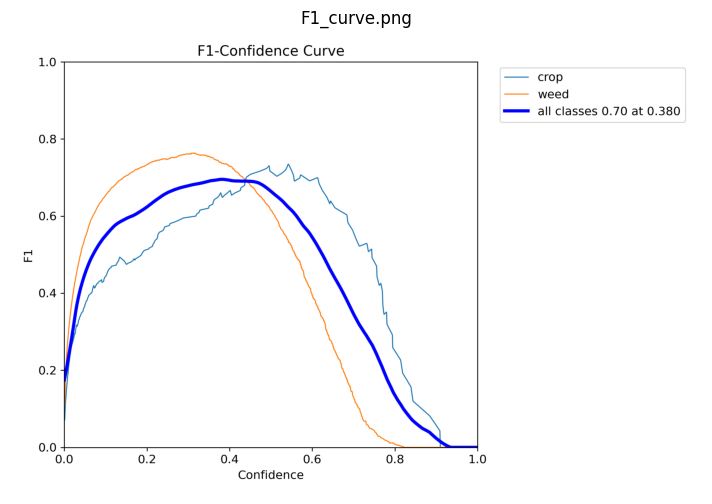

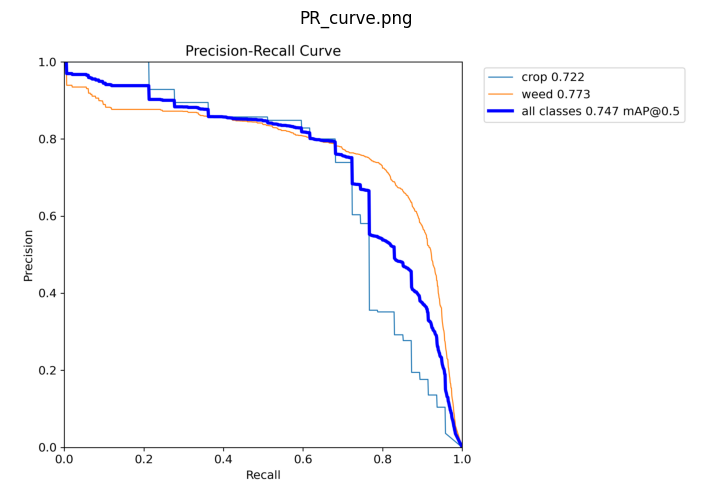

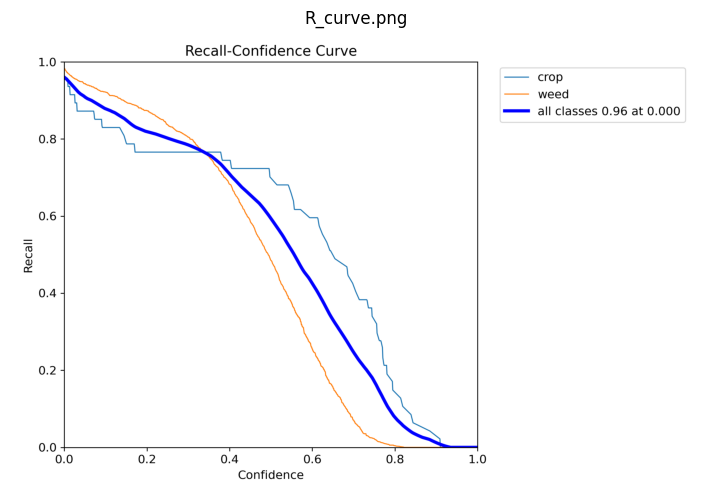

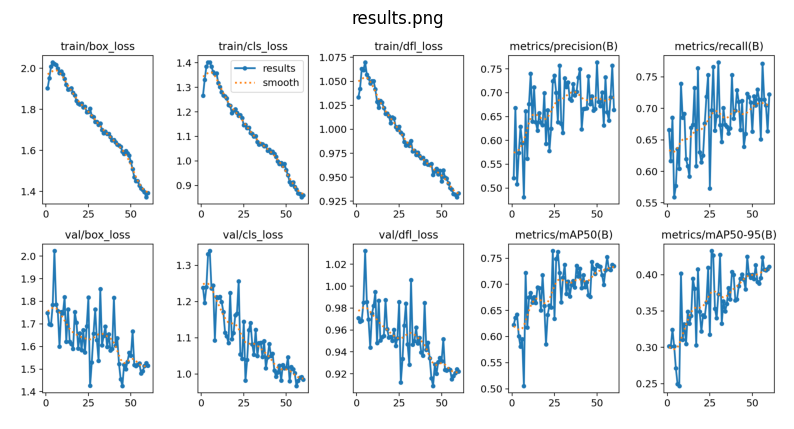

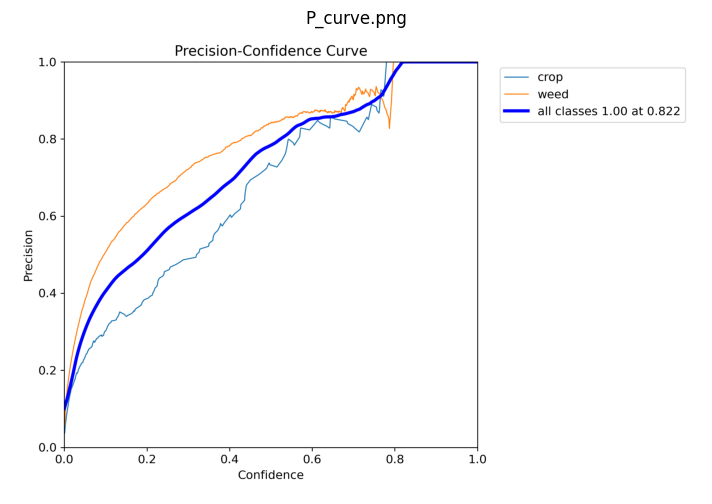

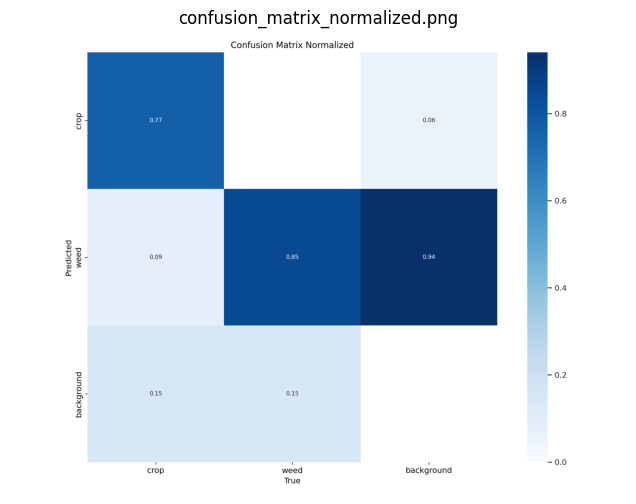

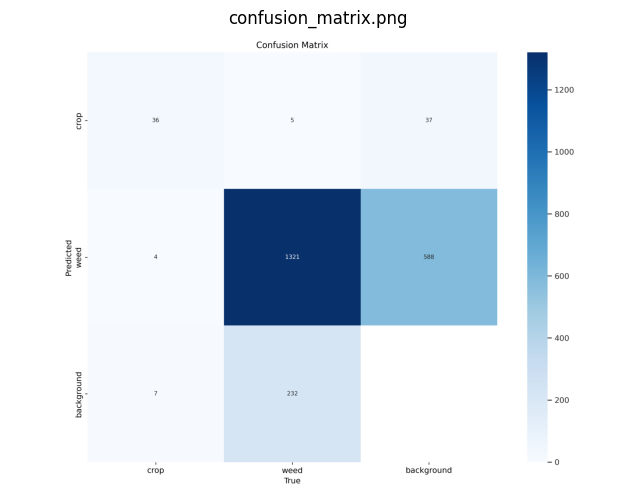

In [30]:
# Define the folder containing the saved plots
plots_folder = '/content/runs/detect/train22'

# List all files in the directory
plot_files = os.listdir(plots_folder)

image_extensions = ('.png')
plot_files = [f for f in plot_files if f.lower().endswith(image_extensions)]

# Display the plots
for plot_file in plot_files:
    # Create full path to the image
    image_path = os.path.join(plots_folder, plot_file)
    # Load and display the image
    img = plt.imread(image_path)
    plt.figure(figsize=(10, 6))
    plt.imshow(img)
    plt.axis('off')
    plt.title(plot_file)
    plt.show()

In [ ]:
# Ensure this import works with your YOLO model setup

def detect_and_display_images(image_paths, model_path, output_folder="output", img_size=640, conf=0.5):
    # Load the trained YOLO model
    model = YOLO(model_path)

    # Create output folder if it doesn't exist
    os.makedirs(output_folder, exist_ok=True)

    for input_image_path in image_paths:
        # Check if the input image exists
        if not os.path.isfile(input_image_path):
            print(f"File not found: {input_image_path}. Skipping.")
            continue

        # Run inference
        results = model.predict(source=input_image_path, imgsz=img_size, conf=conf)

        # Save the result images
        for result in results:
            # Define output image path
            base_name = os.path.basename(input_image_path)
            output_image_path = os.path.join(output_folder, f"detected_{base_name}")

            # Save the output image
            result.save(output_image_path)

            # Load the image for display
            img = mpimg.imread(output_image_path)

            # Plot the image
            plt.figure(figsize=(10, 6))
            plt.imshow(img)
            plt.axis('off')  # Optional: Turn off axis labels
            plt.title(f"Detected: {base_name}")  # Add title for clarity
            plt.show()

In [ ]:
def get_image_paths_from_directory(directory, num_images=10):
    # List all files in the directory
    all_files = os.listdir(directory)

    # Filter for image files (adjust extensions as needed)
    image_files = [f for f in all_files if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

    # Get the full paths and limit to the first num_images
    image_paths = [os.path.join(directory, f) for f in image_files[:num_images]]
    return image_paths


image 1/1 /content/WeedCrop.v1i.yolov5pytorch/test/images/34132_jpg.rf.ca9a55e5ed6857be80d1cb3e40f010ad.jpg: 384x640 1 weed, 67.3ms
Speed: 2.3ms preprocess, 67.3ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)


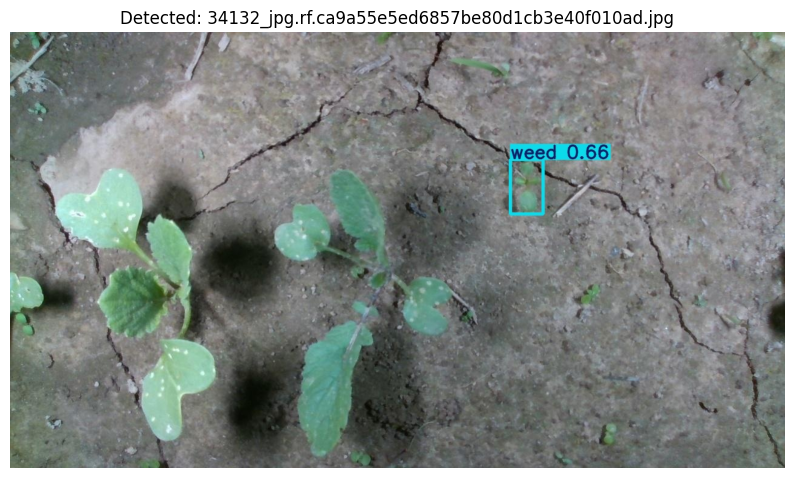


image 1/1 /content/WeedCrop.v1i.yolov5pytorch/test/images/34008_jpg.rf.d6a18da6623fc801c5b64969ea382311.jpg: 384x640 (no detections), 21.9ms
Speed: 2.3ms preprocess, 21.9ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


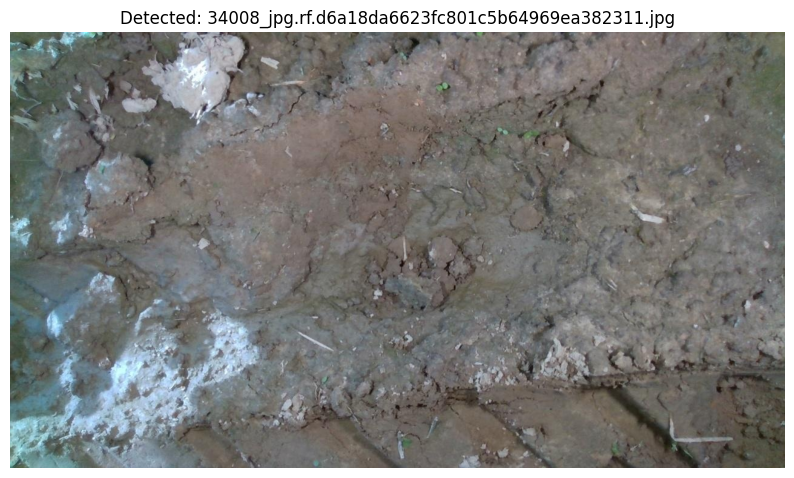


image 1/1 /content/WeedCrop.v1i.yolov5pytorch/test/images/12198_jpg.rf.a216dcc7b89a168893ccd130a89553ee.jpg: 384x640 2 weeds, 16.3ms
Speed: 2.1ms preprocess, 16.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


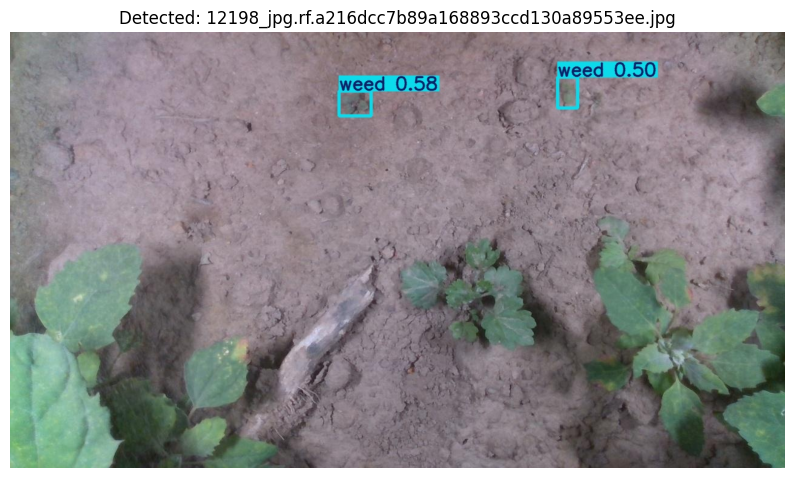


image 1/1 /content/WeedCrop.v1i.yolov5pytorch/test/images/34019_jpg.rf.6f011d82fa669a46a3e1940b7ea799ed.jpg: 384x640 (no detections), 13.1ms
Speed: 3.6ms preprocess, 13.1ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


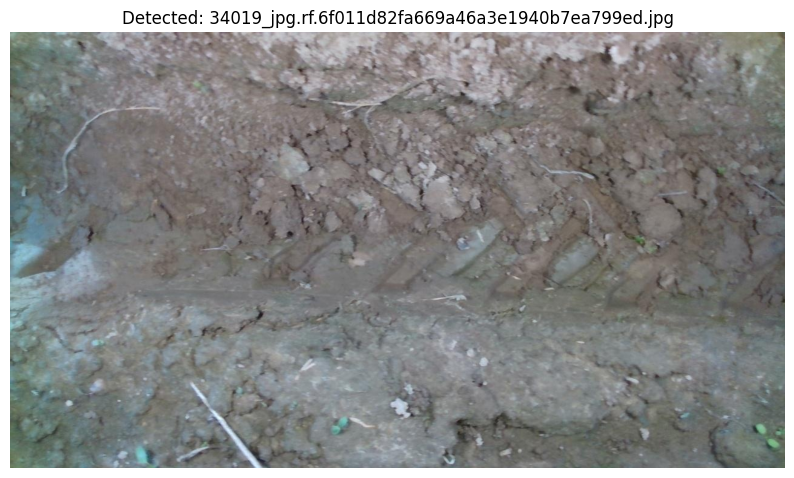


image 1/1 /content/WeedCrop.v1i.yolov5pytorch/test/images/32757_jpg.rf.602a1d18b252432bacfe0d750395be40.jpg: 384x640 1 weed, 15.4ms
Speed: 2.2ms preprocess, 15.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


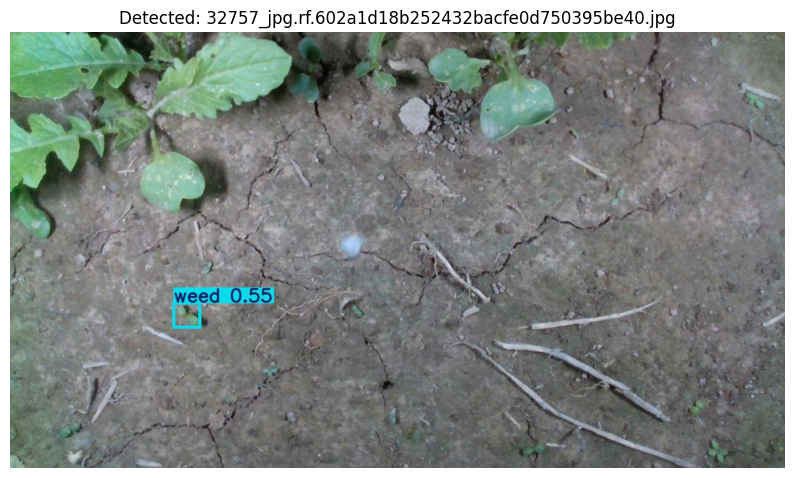


image 1/1 /content/WeedCrop.v1i.yolov5pytorch/test/images/32429_jpg.rf.22d609ca981966f966a0f8919cafdeb0.jpg: 384x640 10 weeds, 15.5ms
Speed: 2.2ms preprocess, 15.5ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)


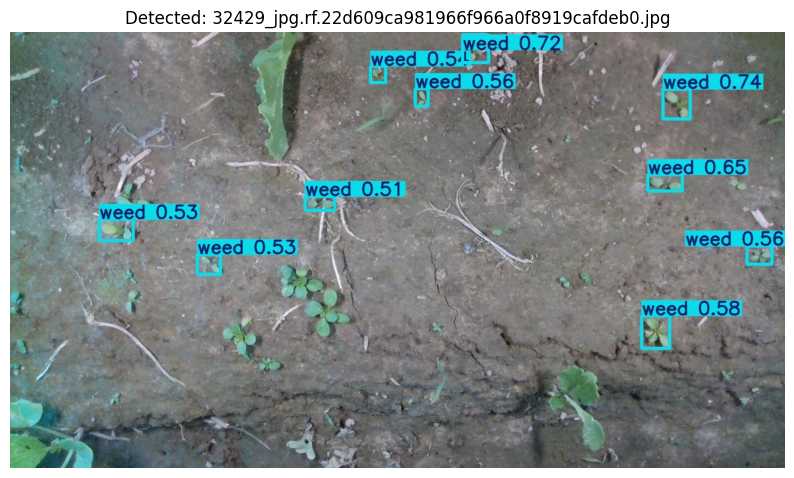


image 1/1 /content/WeedCrop.v1i.yolov5pytorch/test/images/32803_jpg.rf.473444b96352419c7ed1f229bae8de77.jpg: 384x640 1 weed, 17.8ms
Speed: 2.2ms preprocess, 17.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


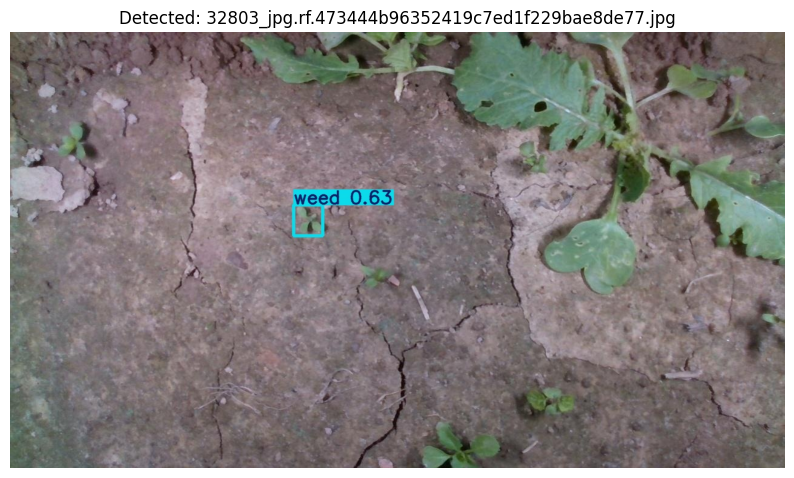


image 1/1 /content/WeedCrop.v1i.yolov5pytorch/test/images/33668_jpg.rf.c0c12a420b7652fb69c9d247b705af2f.jpg: 384x640 1 weed, 21.7ms
Speed: 5.6ms preprocess, 21.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


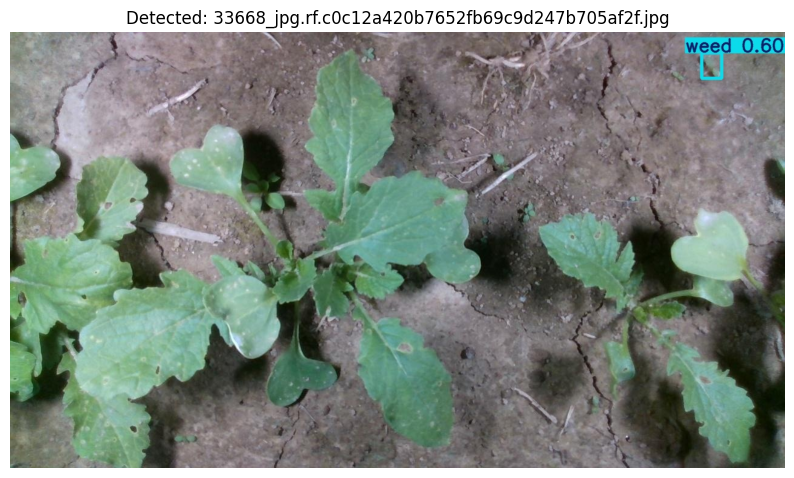


image 1/1 /content/WeedCrop.v1i.yolov5pytorch/test/images/34007_jpg.rf.a5f57ce893faf890604dbdbf88b0e319.jpg: 384x640 (no detections), 15.6ms
Speed: 4.4ms preprocess, 15.6ms inference, 5.1ms postprocess per image at shape (1, 3, 384, 640)


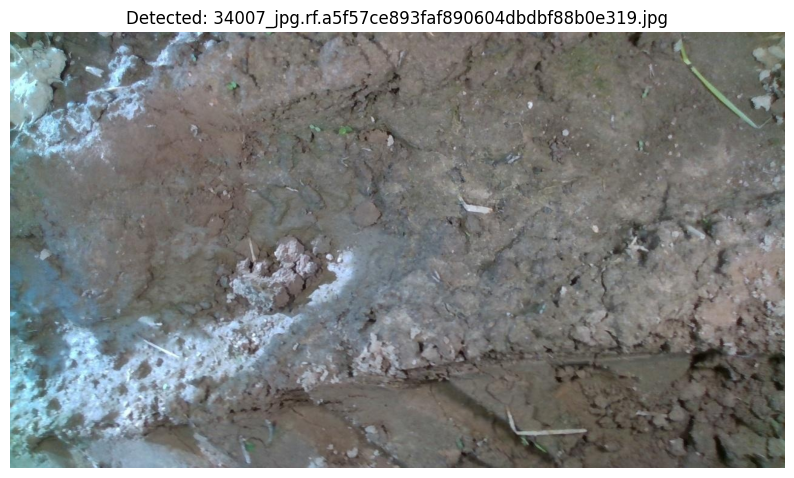


image 1/1 /content/WeedCrop.v1i.yolov5pytorch/test/images/IMG_6198_JPG.rf.879f46dd3db8a520cd8d4143e4342ef4.jpg: 384x640 6 crops, 19.6ms
Speed: 1.6ms preprocess, 19.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


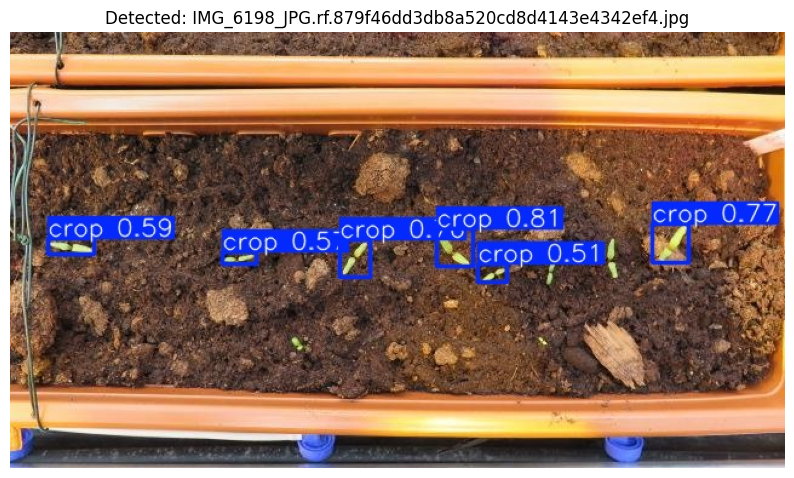

In [ ]:
# Example usage
input_directory = '/content/WeedCrop.v1i.yolov5pytorch/test/images'
model_path = '/content/runs/detect/train22/weights/best.pt'

# Get the first 10 image paths
image_paths = get_image_paths_from_directory(input_directory, num_images=10)

# Detect and display images
detect_and_display_images(image_paths, model_path)